## Library loading

In [1]:
import scanpy as sc, anndata as ad, numpy as np, pandas as pd
from scipy import sparse
from anndata import AnnData
import warnings
import socket
from matplotlib import pylab
import sys
import plotly.express as px

import yaml
import seaborn as sns
import itertools
import random
import rpy2

import rpy2.robjects as ro
import os
import matplotlib.pyplot as plt

warnings.filterwarnings('ignore')

In [2]:
import ipynbname
try:
    nb_fname = ipynbname.name()
except:
    nb_fname = "".join(os.path.basename(globals()["__vsc_ipynb_file__"]).split(".")[:-1])

In [3]:
%matplotlib inline

In [4]:
sc.settings.verbosity = 3         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=50, facecolor='white', dpi_save=300)
pylab.rcParams['figure.figsize'] = (9, 9)


scanpy==1.8.1 anndata==0.7.6 umap==0.4.6 numpy==1.20.2 scipy==1.6.3 pandas==1.2.4 scikit-learn==0.24.2 statsmodels==0.13.1 python-igraph==0.9.8 louvain==0.7.1 pynndescent==0.5.5


### Configure paths

In [5]:
hostRoot = "-".join(socket.gethostname().split('-')[0:2])


#indir=paths["paths"]["indir"][hostRoot]
outdir="./outdir"
outdirFigs = "./figures"
#projectBaseDir=paths["paths"]["projectBaseDir"][hostRoot]
markerGenes = "./data/resources/marker_genes.tsv"
additionalMarkers = ["FGF8","NRG1","NRG3","SFRP2","BMP2","BMP4","WNT3A","WNT5A","WNT2B"]
colorMapPath = "./colorMap.yaml"
with open(colorMapPath, 'r') as f:
    colorMap = yaml.load(f, Loader=yaml.FullLoader)["uns_colors"]
colorMap
markers = "./data/resources/F_T.markers.scored.tsv"
output_basename = "04_RG_and_Neurons_Focus.DEA"


In [6]:
adata = sc.read_h5ad(outdir+"/3_polaroid_quickAnno.h5ad")

In [7]:
adata.obs["leiden0.3Anno"] = adata.obs["leiden0.3"].replace({"2":"2-ExN1","8":"8-ExN2","4":"4-RGC1","5":"5-RGC2"})

# SC-based pairwise DEA

... storing 'leiden0.3Anno' as categorical


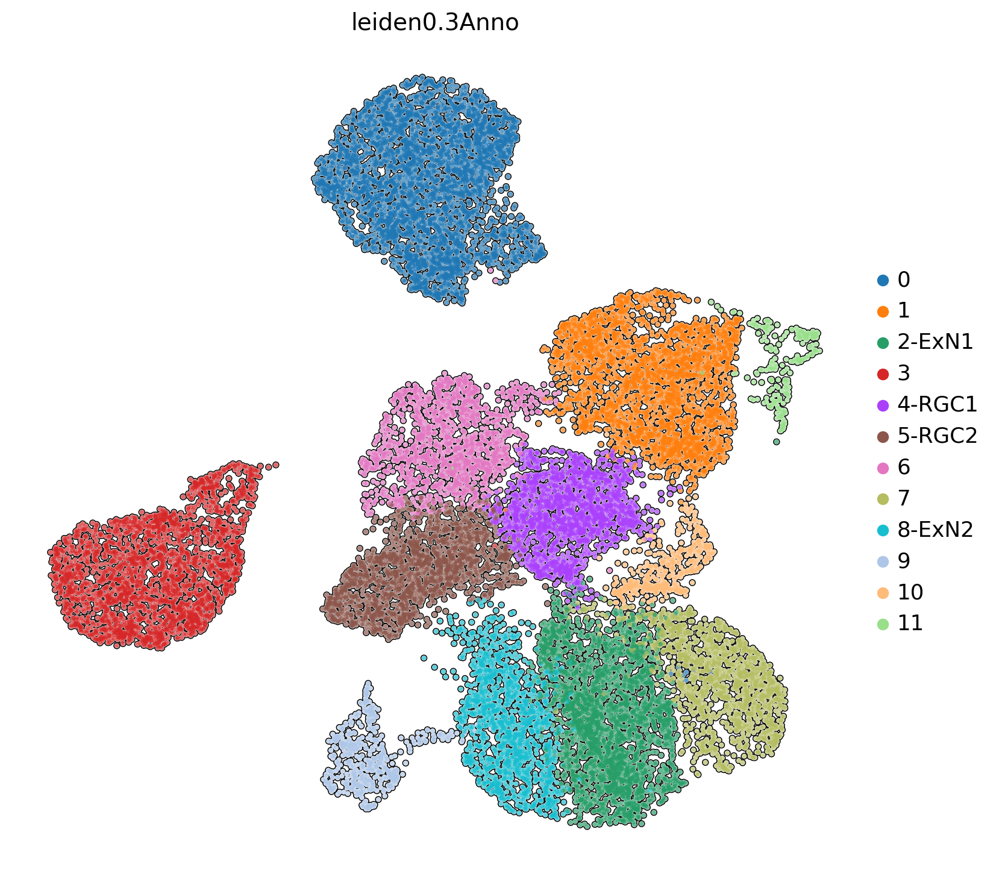

In [8]:
sc.pl.umap(adata, color="leiden0.3Anno", ncols = 2, size = 30, add_outline = True,outline_width=(0.2, 0.05), frameon=False)

## Excitatory


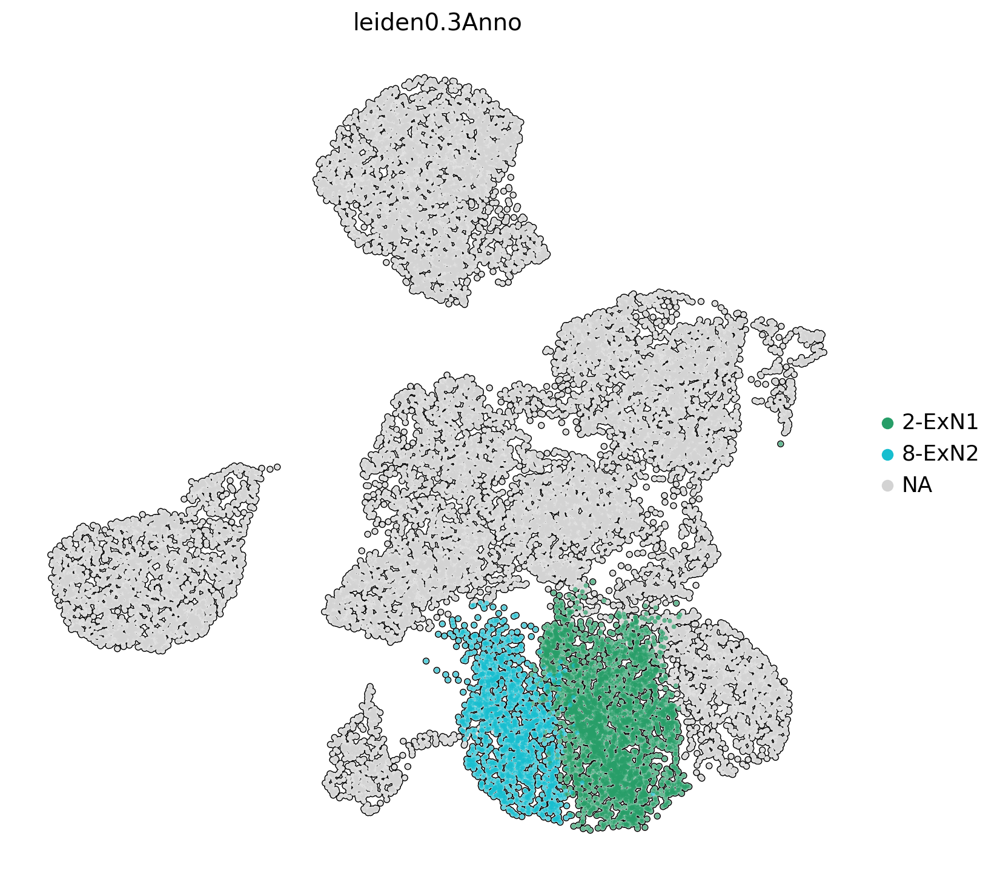

In [9]:
sc.pl.umap(adata, color="leiden0.3Anno", groups=["2-ExN1","8-ExN2"] ,size = 30, add_outline = True,outline_width=(0.2, 0.05), 
           frameon=False, save=nb_fname+".EXN.pdf")



In [10]:
#Here we extract ExnOnly adata just to revert the scaling
adataExN = adata[adata.obs["leiden0.3Anno"].isin(["2-ExN1","8-ExN2"])].copy()
adataExN.X = adata.raw.to_adata()[adataExN.obs_names,adataExN.var_names].X
adataExN.layers['scaled'] = sc.pp.scale(adataExN, copy=True).X

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


### 8(ExN2) vs 8(ExN1)


ranking genes
    finished: added to `.uns['8-ExN2_vs_2-ExN1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


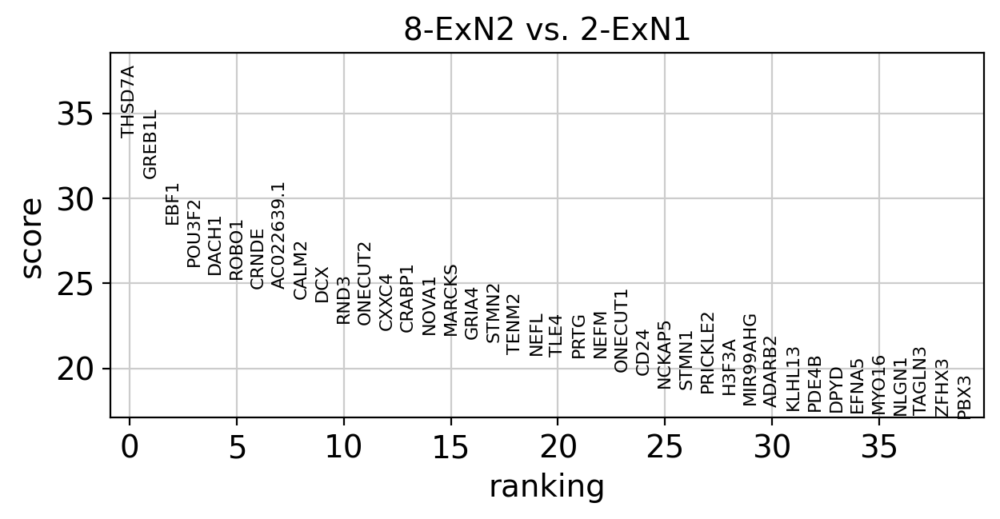

In [11]:
sc.tl.rank_genes_groups(adataExN, groupby="leiden0.3Anno",reference = "2-ExN1",groups=["8-ExN2"], key_added="8-ExN2_vs_2-ExN1",  method="wilcoxon")

pylab.rcParams['figure.figsize'] = (7, 3)
sc.pl.rank_genes_groups(adataExN, key="8-ExN2_vs_2-ExN1", n_genes=40)
scoresExN2 = sc.get.rank_genes_groups_df(adataExN, key="8-ExN2_vs_2-ExN1", group="8-ExN2")
#sc.pl.rank_genes_groups_matrixplot(adata, n_genes=10,key="8-ExN2_vs_2-ExN1", use_raw=False, vmin=-3, vmax=3, cmap='bwr')
pylab.rcParams['figure.figsize'] = (9,9)

### 2(ExN1) vs 8(ExN2)

ranking genes
    finished: added to `.uns['2-ExN1_vs_8-ExN2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


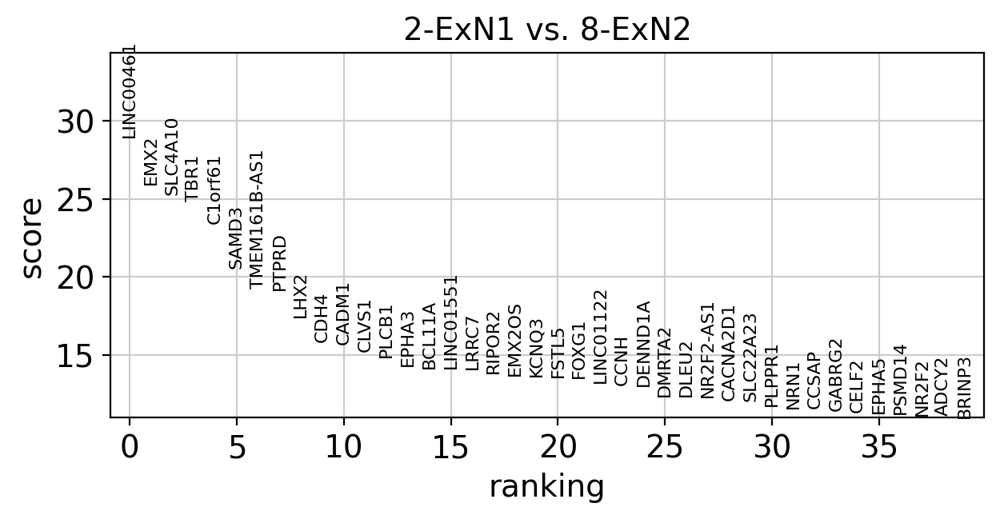

In [12]:
sc.tl.rank_genes_groups(adataExN, groupby="leiden0.3Anno",reference = "8-ExN2",groups=["2-ExN1"], key_added="2-ExN1_vs_8-ExN2",  method="wilcoxon")

pylab.rcParams['figure.figsize'] = (7, 3)
sc.pl.rank_genes_groups(adataExN, key="2-ExN1_vs_8-ExN2", n_genes=40)
pylab.rcParams['figure.figsize'] = (9,9)

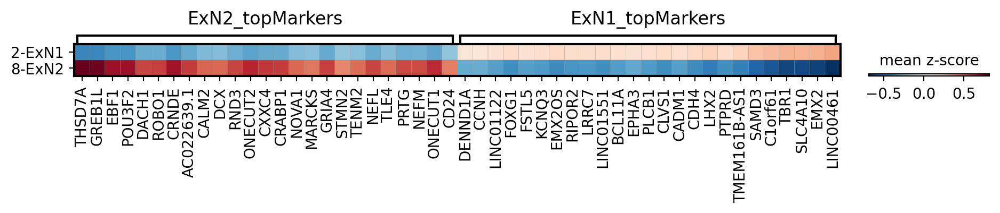

In [13]:
ExN2_topMarkers = {"ExN2_topMarkers":scoresExN2.head(50).names.tolist()}
ExN1_topMarkers = {"ExN1_topMarkers":scoresExN2.tail(50).names.tolist()}
AllMarkers = {"ExN2_topMarkers":scoresExN2.head(25).names.tolist(),
              "ExN1_topMarkers":scoresExN2.tail(25).names.tolist()}

pylab.rcParams['figure.figsize'] = (10, 5)

plt.rcParams.update({'font.size': 12})

sc.pl.matrixplot(adataExN, AllMarkers, "leiden0.3Anno", dendrogram=False,swap_axes=False,figsize=(11,.4),var_group_rotation=0,save="EXN1_VS_EXN2.pdf",
                 colorbar_title='mean z-score', layer="scaled",cmap='RdBu_r')

plt.rcParams.update({'font.size': 14})


pylab.rcParams['figure.figsize'] = (9,9)


## Radial Glia


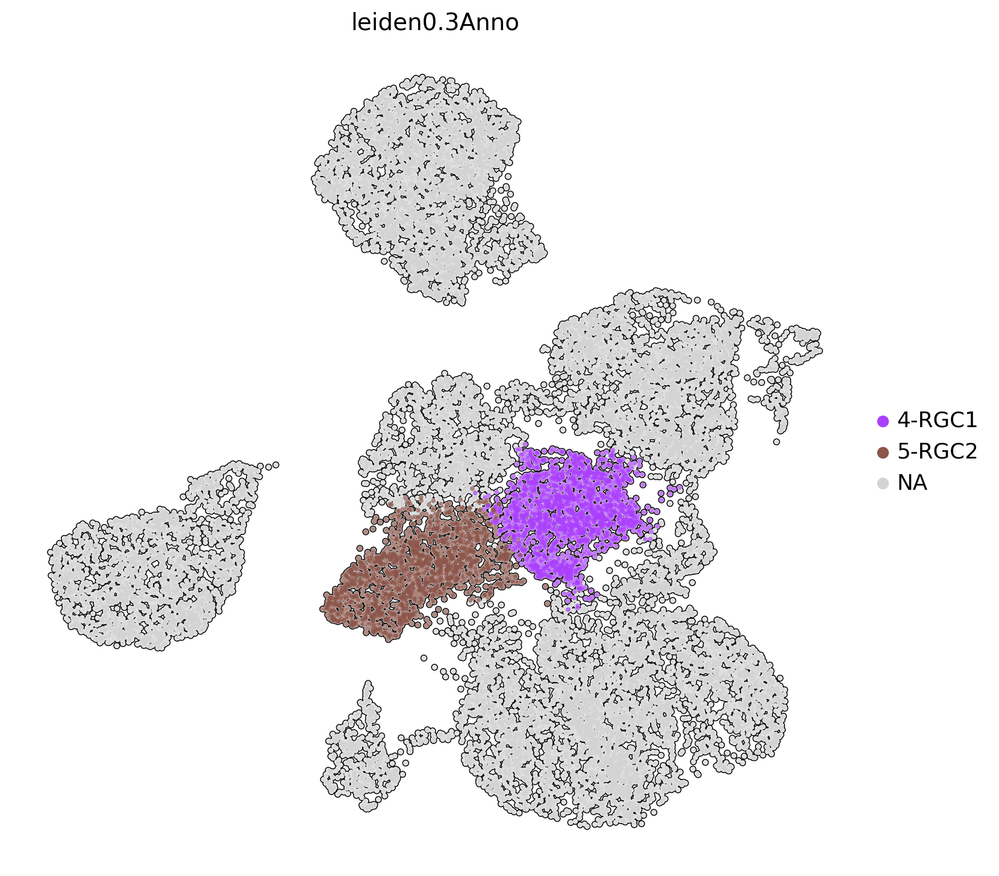

In [14]:
sc.pl.umap(adata, color="leiden0.3Anno", groups=["4-RGC1","5-RGC2"] ,size = 30, add_outline = True,outline_width=(0.2, 0.05), 
           frameon=False, save=nb_fname+".RGCs.pdf")

In [15]:
#Here we extract RGOnly adata just to revert the scaling
adataRg = adata[adata.obs["leiden0.3Anno"].isin(["4-RGC1","5-RGC2"])].copy()
adataRg.X = adata.raw.to_adata()[adataRg.obs_names,adataExN.var_names].X
adataRg.layers['scaled'] = sc.pp.scale(adataRg, copy=True).X

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


### 4(RGC1) vs 5(RGC2)

ranking genes
    finished: added to `.uns['4-RGC1_vs_5-RGC2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


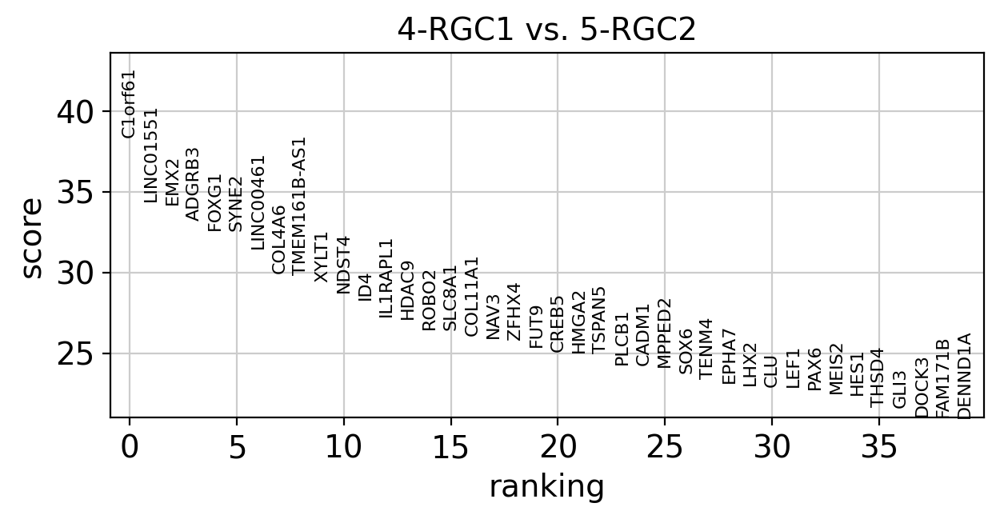

In [16]:
sc.tl.rank_genes_groups(adataRg, groupby="leiden0.3Anno",reference = "5-RGC2",groups=["4-RGC1"], key_added="4-RGC1_vs_5-RGC2",  method="wilcoxon")

pylab.rcParams['figure.figsize'] = (7, 3)
sc.pl.rank_genes_groups(adataRg, key="4-RGC1_vs_5-RGC2", n_genes=40)
scoresRGC1 = sc.get.rank_genes_groups_df(adataRg, key="4-RGC1_vs_5-RGC2", group="4-RGC1")

pylab.rcParams['figure.figsize'] = (9,9)

### 5(RGC2) vs 4(RGC1)

ranking genes
    finished: added to `.uns['5-RGC2_vs_4-RGC1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


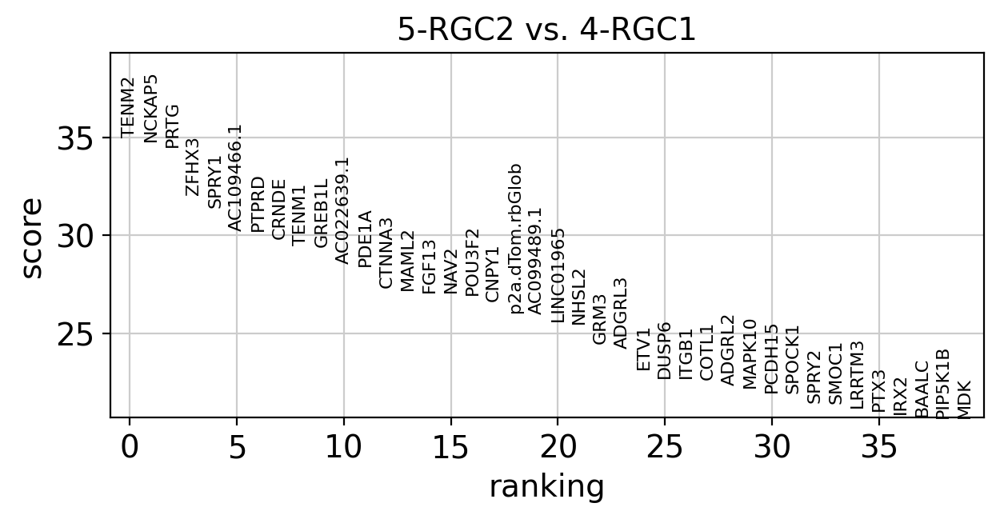

In [17]:
sc.tl.rank_genes_groups(adataRg, groupby="leiden0.3Anno",reference = "4-RGC1",groups=["5-RGC2"], key_added="5-RGC2_vs_4-RGC1",  method="wilcoxon")

pylab.rcParams['figure.figsize'] = (7, 3)
sc.pl.rank_genes_groups(adataRg, key="5-RGC2_vs_4-RGC1", n_genes=40)
pylab.rcParams['figure.figsize'] = (9,9)

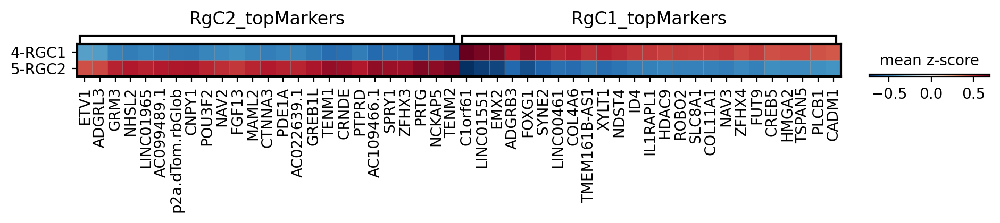

In [18]:
RgC1_topMarkers = {"RgC1_topMarkers":scoresRGC1.head(50).names.tolist()}
RgC2_topMarkers = {"RgC2_topMarkers":scoresRGC1.tail(50).names.tolist()}
AllMarkers = {"RgC2_topMarkers":scoresRGC1.tail(25).names.tolist(),
              "RgC1_topMarkers":scoresRGC1.head(25).names.tolist()}

pylab.rcParams['figure.figsize'] = (10, 3)
plt.rcParams.update({'font.size': 12})

sc.pl.matrixplot(adataRg, AllMarkers, "leiden0.3Anno", dendrogram=False,swap_axes=False,figsize=(11,.4),var_group_rotation=0,save="RGC1_VS_RGC2.pdf",
                 colorbar_title='mean z-score', layer="scaled",cmap='RdBu_r')

plt.rcParams.update({'font.size': 14})
pylab.rcParams['figure.figsize'] = (9,9)


## Here we extract top 250 (wilcoxon score) up For each contrast

In [19]:
RG1markers = sc.get.rank_genes_groups_df(adataRg, key="4-RGC1_vs_5-RGC2", group="4-RGC1")
RG1markers = RG1markers[(RG1markers.logfoldchanges > 0) & ( RG1markers.pvals_adj < 0.05)]
RG1markers["leidenAnno"] = "RGCs-1"


RG2markers = sc.get.rank_genes_groups_df(adataRg, key="5-RGC2_vs_4-RGC1", group="5-RGC2")
RG2markers = RG2markers[(RG2markers.logfoldchanges > 0) & ( RG2markers.pvals_adj < 0.05)]
RG2markers["leidenAnno"] = "RGCs-2"

pd.concat([RG1markers,RG2markers], ignore_index=True).to_excel(outdir+"/"+output_basename+".SCwilcoxon.RGC1_vs_RGC2.xls")


#sc.get.rank_genes_groups_df(adataRg, key="5-RGC2_vs_4-RGC1", group="5-RGC2")[sc.get.rank_genes_groups_df(adataRg, key="5-RGC2_vs_4-RGC1", group="5-RGC2").pvals_adj < 0.01].head(250).to_excel(outdir+"/"+output_basename+".SCwilcoxon.RGC2_vs_RGC1.xls")

In [20]:
Exc1markers = sc.get.rank_genes_groups_df(adataExN, key="2-ExN1_vs_8-ExN2", group="2-ExN1")
Exc1markers = Exc1markers[(Exc1markers.logfoldchanges > 0) & ( Exc1markers.pvals_adj < 0.05)]
Exc1markers["leidenAnno"] = "EXN-1"

Exc2markers = sc.get.rank_genes_groups_df(adataExN, key="8-ExN2_vs_2-ExN1", group="8-ExN2")
Exc2markers = Exc2markers[(Exc2markers.logfoldchanges > 0) & ( Exc2markers.pvals_adj < 0.05)]
Exc2markers["leidenAnno"] = "EXN-2"

pd.concat([Exc1markers,Exc2markers], ignore_index=True).to_excel(outdir+"/"+output_basename+".SCwilcoxon.ExcN1_vs_ExcN2.xls")
                       

# Pseudobulk approach

In [21]:

adataSelected = sc.read_h5ad(outdir+"/1_polaroid_mint.h5ad")[adata.obs_names]
adataSelected.obs = adata.obs
adataSelected = adataSelected[adataSelected.obs["leiden0.3Anno"].isin(["2-ExN1","8-ExN2","4-RGC1","5-RGC2"])].copy()
sc.pp.normalize_total(adataSelected)

adataSelected.write(outdir+"/RG_N_preBulk.h5ad")


normalizing counts per cell
    finished (0:00:00)


In [22]:
adataSelected = sc.read_h5ad(outdir+"/RG_N_preBulk.h5ad")

In [23]:
groupingCovariate = "leiden0.3Anno"
PseudooReplicates_per_group = 10
print("Pbulking with target of "+str(PseudooReplicates_per_group)+" PRs will result in following cells per PR")
adataSelected.obs.groupby(groupingCovariate).size() / PseudooReplicates_per_group


Pbulking with target of 10 PRs will result in following cells per PR


leiden0.3Anno
2-ExN1    238.8
4-RGC1    163.8
5-RGC2    154.4
8-ExN2    126.2
dtype: float64

In [24]:
# In[ ]:


total = pd.DataFrame(index = adataSelected.var_names)
total_metadataSelected = pd.DataFrame(index= ["_".join(Rep) for Rep in  list(itertools.product(adataSelected.obs[groupingCovariate].cat.categories.tolist(), [str(r)  for r in list(range(PseudooReplicates_per_group))]))])
for group in adataSelected.obs[groupingCovariate].cat.categories:
    groupadataSelected = adataSelected[adataSelected.obs[groupingCovariate] == group].copy()
    
    group_cells = groupadataSelected.obs_names.tolist()
    random.Random(4).shuffle(group_cells)
    
    metaCellslist=[group_cells[i::PseudooReplicates_per_group] for i in range(PseudooReplicates_per_group)]
    
    for partition in enumerate(metaCellslist):
        
        total['{}_{}'.format(group, partition[0])] = adataSelected[partition[1]].X.sum(axis = 0).A1
    
        total_metadataSelected.loc['{}_{}'.format(group, partition[0]),"group"] = group
        total_metadataSelected.loc['{}_{}'.format(group, partition[0]),"pseudoreplicate"] = partition[0]
        total_metadataSelected.loc['{}_{}'.format(group, partition[0]),"number_of_cell"] = int(len(partition[1]))
    
    #With this line we propagate - whenever possible -  obs to aggregated pReplicate
    for obsMD in [obsMD for obsMD in groupadataSelected.obs.columns.tolist() if len(groupadataSelected.obs[obsMD].unique()) == 1 and obsMD != groupingCovariate]:
        total_metadataSelected.loc[["_".join(l) for l in list(itertools.product([group],[str(r)  for r in list(range(PseudooReplicates_per_group))]))], obsMD ] = adataSelected.obs.loc[adataSelected.obs[groupingCovariate] == group,obsMD][0]
        
        
total_metadataSelected = total_metadataSelected.dropna(axis = 1)



adataSelected_bulk = sc.AnnData(total.transpose()).copy()
adataSelected_bulk.var = adataSelected.var.copy()
adataSelected_bulk.obs = pd.concat([adataSelected_bulk.obs, total_metadataSelected], axis = 1)
adataSelected_bulk.obs["group"] =adataSelected_bulk.obs["group"].astype("category")


In [25]:
%load_ext rpy2.ipython

In [26]:
%%R
library(edgeR)
library(org.Hs.eg.db)
library(AnnotationDbi)
library(stats)
library(topGO)

R[write to console]: Loading required package: limma

R[write to console]: Loading required package: AnnotationDbi

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: Loading required package: parallel

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


R[write to console]: The following object is masked from ‘package:limma’:

    plotMA


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, 

In [27]:
%matplotlib inline

In [28]:
sc.settings.verbosity = 3         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=50, facecolor='white')
pylab.rcParams['figure.figsize'] = (10, 10)


scanpy==1.8.1 anndata==0.7.6 umap==0.4.6 numpy==1.20.2 scipy==1.6.3 pandas==1.2.4 scikit-learn==0.24.2 statsmodels==0.13.1 python-igraph==0.9.8 louvain==0.7.1 pynndescent==0.5.5


## Load  pseudobulk

In [29]:
adataSelected_bulk.obs

,group,pseudoreplicate,number_of_cell,is.Stressed,leiden0.3,leidenAnno
2-ExN1_0,2-ExN1,0.0,239.0,not_stressed,2,EXN-1
2-ExN1_1,2-ExN1,1.0,239.0,not_stressed,2,EXN-1
2-ExN1_2,2-ExN1,2.0,239.0,not_stressed,2,EXN-1
2-ExN1_3,2-ExN1,3.0,239.0,not_stressed,2,EXN-1
2-ExN1_4,2-ExN1,4.0,239.0,not_stressed,2,EXN-1
2-ExN1_5,2-ExN1,5.0,239.0,not_stressed,2,EXN-1
2-ExN1_6,2-ExN1,6.0,239.0,not_stressed,2,EXN-1
2-ExN1_7,2-ExN1,7.0,239.0,not_stressed,2,EXN-1
2-ExN1_8,2-ExN1,8.0,238.0,not_stressed,2,EXN-1
2-ExN1_9,2-ExN1,9.0,238.0,not_stressed,2,EXN-1


## Reorder counts cols

In [30]:
#adata = adata[adata.obs["group"].isin(RelevantAreas)]
total = total[adataSelected_bulk.obs_names]

## DEA

### RPY INITIALIZATION

In [31]:
edgeR_topTags = ro.r['topTags']
edgeR_glmLRT = ro.r['glmLRT']
edgeR_glmQLFTest = ro.r['glmQLFTest']
as_data_frame = ro.r['as.data.frame']
rprint = rpy2.robjects.globalenv.find("print")

In [32]:
DEGs = {}
TestCov = "group"

In [33]:
adataSelected_bulk.obs.group.value_counts()

2-ExN1    10
4-RGC1    10
5-RGC2    10
8-ExN2    10
Name: group, dtype: int64

In [34]:
levelsToMap = ["2-ExN1","8-ExN2","4-RGC1","5-RGC2"]

### MM

In [35]:
obs = adataSelected_bulk.obs[[TestCov,"pseudoreplicate"]].copy()
obs["pseudoreplicate"] = obs.index.tolist()
obs["TestCov"] = obs[TestCov]

#obs["TestCov"] = obs[TestCov]

In [36]:
obs.group.unique()

['2-ExN1', '4-RGC1', '5-RGC2', '8-ExN2']
Categories (4, object): ['2-ExN1', '4-RGC1', '5-RGC2', '8-ExN2']

### Counts

In [37]:
totalRelevant = total[obs.index]


In [38]:
minCounts = totalRelevant[totalRelevant > 0].min(axis = 1).min()

#Universe 1 count in at least 5% of samples per group
groupThreshold = round(pd.get_dummies(obs[TestCov]).T.sum(axis = 1) *0.05)
bolMatrix = (np.matrix(np.dot(pd.get_dummies(obs[TestCov]).T, (totalRelevant > 0).astype(int).T)) - np.matrix(groupThreshold).T > 0)
bolVect = (bolMatrix.sum(axis = 0) >= 1).A1
totalRelevant = totalRelevant.loc[bolVect]
len(totalRelevant)

28261

In [39]:
universe = totalRelevant.index.tolist()

In [40]:
%%R -i obs -i totalRelevant -i levelsToMap -o dds 

mmVector<- factor(obs$TestCov, levels = c(levelsToMap))

mm <- model.matrix(~mmVector )
row.names(mm) <- colnames(totalRelevant)

dds <- DGEList(totalRelevant, group = obs$TestCov, genes = rownames(totalRelevant))

#Ennotate with entrez genes
anno <- select(org.Hs.eg.db, keys=rownames(dds$counts),columns=c("ENTREZID","SYMBOL"),keytype="SYMBOL")
colnames(anno) <- c("genes","entrez")
anno <- anno[!duplicated(anno$genes, fromLast=T), ]
dds$genes$entrez <- merge(x = data.frame(dds$genes), y = anno, by = "genes", all.x = TRUE)$entrez

dim(dds)

R[write to console]: 'select()' returned 1:many mapping between keys and columns



[1] 28261    40


In [41]:
%%R

mm

         (Intercept) mmVector8-ExN2 mmVector4-RGC1 mmVector5-RGC2
2-ExN1_0           1              0              0              0
2-ExN1_1           1              0              0              0
2-ExN1_2           1              0              0              0
2-ExN1_3           1              0              0              0
2-ExN1_4           1              0              0              0
2-ExN1_5           1              0              0              0
2-ExN1_6           1              0              0              0
2-ExN1_7           1              0              0              0
2-ExN1_8           1              0              0              0
2-ExN1_9           1              0              0              0
4-RGC1_0           1              0              1              0
4-RGC1_1           1              0              1              0
4-RGC1_2           1              0              1              0
4-RGC1_3           1              0              1              0
4-RGC1_4  

In [42]:
%%R -i minCounts

#keep <- filterByExpr(dds, min.count = minCounts, min.total.count = minCounts*5)
#dds <- dds[keep,,keep.lib.sizes=FALSE]
dim(dds)

[1] 28261    40


In [43]:
%%R
dds <- calcNormFactors(dds)
dds <- estimateGLMRobustDisp(dds, mm)
fit <- glmFit(dds, mm)

## MAP contrasts

In [44]:
%%R -o ExcN2_vs_ExcN1 -o RGC2_vs_RGC1
#-o Mid_vs_early -o Late_vs_mid
topn=10000

ExcN2_vs_ExcN1 = topTags(glmLRT(fit, coef=2), adjust.method = "bonferroni",  n = topn, sort.by = "logFC")
RGC2_vs_RGC1 = topTags(glmLRT(fit, contrast=c(0,0,-1,1)), adjust.method = "bonferroni",  n = topn, sort.by = "logFC")


In [45]:

DEGsDict = {"ExcN2_vs_ExcN1":ExcN2_vs_ExcN1,
           "RGC2_vs_RGC1":RGC2_vs_RGC1}


## Volcanos

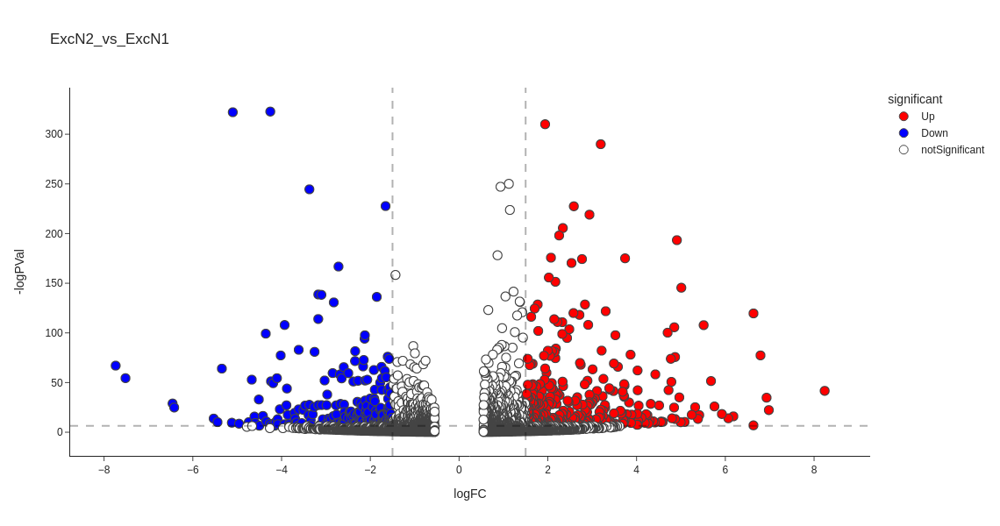

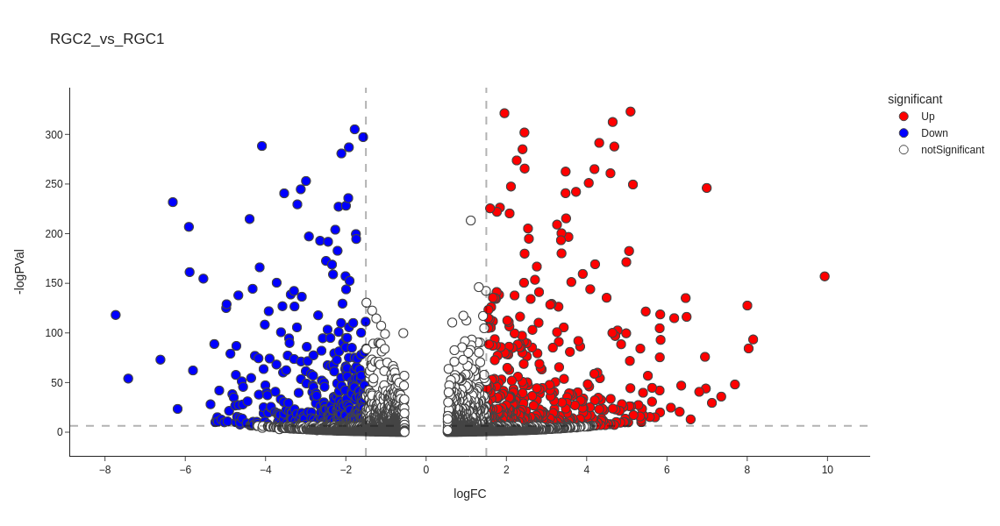

In [46]:



LOGCFTHRESHOLD = 1.5
for k in list(DEGsDict.keys()):
    

    DEGsDict[k] = rpy2.robjects.pandas2ri.rpy2py(as_data_frame(DEGsDict[k]))
    DEGsDict[k]["-logPVal"] = -np.log10(DEGsDict[k].PValue)
    DEGsDict[k]["significant"] = "notSignificant"
    DEGsDict[k].loc[(DEGsDict[k]["logFC"] < -LOGCFTHRESHOLD) &  (DEGsDict[k]["FWER"] < 0.01),"significant"] = "Down"
    DEGsDict[k].loc[(DEGsDict[k]["logFC"] > LOGCFTHRESHOLD) &  (DEGsDict[k]["FWER"] < 0.01),"significant"] = "Up"
    #DEGsDict[k]["knownMarker"] = "unlisted"
    #DEGsDict[k].loc[set(frontalMarkers).intersection(DEGsDict[k].index),"knownMarker"] = "frontal"
    #DEGsDict[k].loc[set(temporalMarkers).intersection(DEGsDict[k].index),"knownMarker"] = "temporal"



    color_discrete_map = {'notSignificant': 'white', 'Up': 'red', 'Down': 'blue'}

    fig = px.scatter(DEGsDict[k], x="logFC", y="-logPVal",
                     #hover_data=DEGsDict[k][["genes","knownMarker"]], 
                     hover_data=DEGsDict[k][["genes"]], 
                     width=600, height=600, 
                     color = "significant", color_discrete_map=color_discrete_map,
                     #symbol="knownMarker",
                     title=k,
                    template="simple_white")
    
    
    fig.update_traces(mode='markers', marker_line_width=1, marker_size=10)
    
    fig.add_hline(y=DEGsDict[k].loc[DEGsDict[k]["FWER"] - 0.01 < 0,"-logPVal" ].min(), 
                  line_color="black",line_width=2, line_dash="dash")

    fig.add_vline(x=LOGCFTHRESHOLD, 
                  line_color="black",line_width=2, line_dash="dash")
        
    fig.add_vline(x=-LOGCFTHRESHOLD, 
                  line_color="black",line_width=2, line_dash="dash")
    fig.write_image(outdirFigs+"/"+nb_fname+"."+k+".volcano.pdf")

    fig.show()
    

# Save

In [47]:
for k in DEGsDict.keys():
    DEGsDict[k][DEGsDict[k].significant != "notSignificant" ].sort_values("logFC", ascending = False).to_excel(outdir+"/"+output_basename+".pBulk."+ k + ".xls")